### ⚾ OBJECTIVE ⚾
This study aims to develop a machine learning model for predicting the salary of baseball players.

![](https://www.baseball-almanac.com/images/SocialMedia/MLB_Minimum_Wage.jpg)

### About Dataset
The dataset was derived from the StatLib library maintained by Carnegie Mellon University. This data was used as part of the poster session for the 1988 American Society of Graphics Association. The salary data were originally from Sports Illustrated, April 20, 1987. Based on the 1987 Baseball Encyclopedia Update published by Collier Books, Macmillan Publishing Company, New York, the 1986 and career statistics were obtained.

### Variables
A data frame with 322 observations of major league players on the following 20 variables.

* AtBat: Number of times at bat in 1986

* Hits: Number of hits in 1986

* HmRun: Number of home runs in 1986

* Runs: Number of runs in 1986

* RBI: Number of runs batted in in 1986

* Walks: Number of walks in 1986

* Years: Number of years in the major leagues

* CAtBat: Number of times at bat during his career

* CHits: Number of hits during his career

* CHmRun: Number of home runs during his career

* CRuns: Number of runs during his career

* CRBI: Number of runs batted in during his career

* CWalks: Number of walks during his career

* League: A factor with levels A and N indicating player's league at the end of 1986

* Division: A factor with levels E and W indicating player's division at the end of 1986

* PutOuts: Number of put outs in 1986

* Assists: Number of assists in 1986

* Errors: Number of errors in 1986

* Salary: 1987 annual salary on opening day in thousands of dollars

* NewLeague: A factor with levels A and N indicating player's league at the beginning of 1987

### Import Libraries

In [1]:
# Python libraries
# Classic,data manipulation and linear algebra

import pandas as pd
import numpy as np

# Plots
import pandas_profiling as pp
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Data processing, metrics and modeling

from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer

# Machine Learning Libraries

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import AdaBoostRegressor

#Display settings

import warnings
warnings.filterwarnings("ignore")


In [2]:
df_ = pd.read_csv("../input/hitters-baseball-data/Hitters.csv")
df = df_.copy()

### Exploratory Data Analysis (EDA)


In [3]:
def check_df(dataframe, head=5):
    print(f'{" Info ":-^39}')
    print(dataframe.info())
    print(f'{" Head ":-^53}')
    print(dataframe.head(head))
    print(f'{" Tail ":-^58}')
    print(dataframe.tail(head))
    print(f'{" Quantiles ":-^97}')
    print(dataframe.describe([0.25, 0.50, 0.75, 0.95, 0.99]).T)


check_df(df)

---------------- Info -----------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 322 entries, 0 to 321
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   AtBat      322 non-null    int64  
 1   Hits       322 non-null    int64  
 2   HmRun      322 non-null    int64  
 3   Runs       322 non-null    int64  
 4   RBI        322 non-null    int64  
 5   Walks      322 non-null    int64  
 6   Years      322 non-null    int64  
 7   CAtBat     322 non-null    int64  
 8   CHits      322 non-null    int64  
 9   CHmRun     322 non-null    int64  
 10  CRuns      322 non-null    int64  
 11  CRBI       322 non-null    int64  
 12  CWalks     322 non-null    int64  
 13  League     322 non-null    object 
 14  Division   322 non-null    object 
 15  PutOuts    322 non-null    int64  
 16  Assists    322 non-null    int64  
 17  Errors     322 non-null    int64  
 18  Salary     263 non-null    float64
 19  NewLeague 

In [4]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
    """
    It provides the names of categorical, numerical, and categorical but cardinal variables.
    Note: Categorical variables with numerical appearance are also included in categorical variables.

    Parameters
    ------
        df: Dataframe
                The dataframe from which variable names are to be retrieved
        cat_th: int, optional
                threshold value for numeric but categorical variables
        car_th: int, optinal
                threshold value for categorical but cardinal variables

    Returns
    ------
        cat_cols: list
                Categorical variable list
        num_cols: list
                Numeric variable list
        cat_but_car: list
                Categorical but cardinal variable list

    Examples
    ------
        import seaborn as sns
        df = sns.load_dataset("iris")
        print(grab_col_names(df))

    Notes
    ------
        cat_cols + num_cols + cat_but_car = total number of variables
        num_but_cat is inside cat_cols.
        The sum of the 3 returned lists equals the total number of variables:
        cat_cols + num_cols + cat_but_car = number of variables

    """
    
    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]

    print(f"Observations: {dataframe.shape[0]}")
    print(f"Variables: {dataframe.shape[1]}")
    print(f'cat_cols: {len(cat_cols)}')
    print(f'num_cols: {len(num_cols)}')
    print(f'cat_but_car: {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car, num_but_cat


cat_cols, num_cols, cat_but_car, num_but_cat = grab_col_names(df)

Observations: 322
Variables: 20
cat_cols: 3
num_cols: 17
cat_but_car: 0
num_but_cat: 0


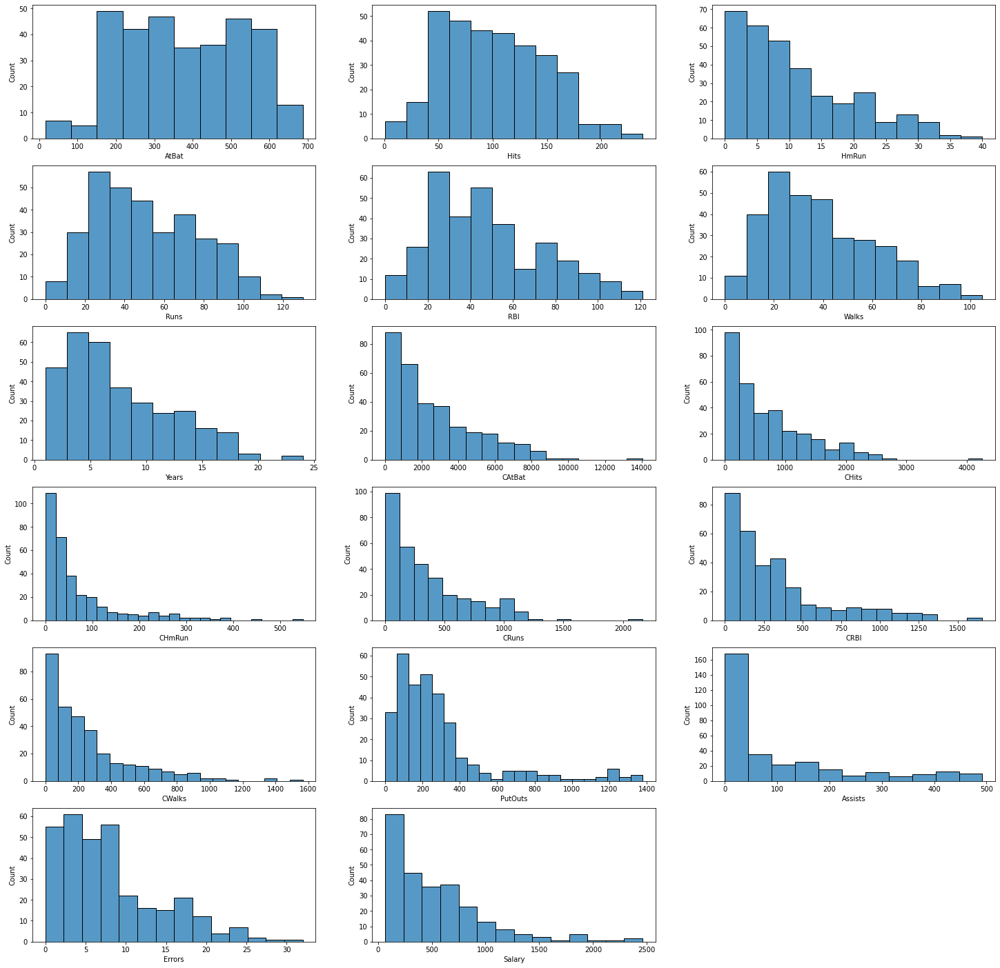

In [5]:
def advance_histogram(df, x_number, y_number):
    plt.figure(figsize=(25, 25))
    for index, col_name in enumerate(df[num_cols], start=1):
        plt.subplot(y_number, x_number, index)
        sns.histplot(data=df, x=col_name)
    plt.show()

# df.hist(figsize=(25, 25))
# plt.show()

advance_histogram(df, 3, 6)

In [6]:
profile = pp.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Feature Engineering

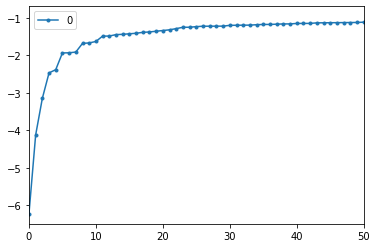

[-6.22769103 -4.12325879 -3.14374811 -2.46483821 -2.37905101 -1.93272894
 -1.92869115 -1.90888951 -1.67752858 -1.66537127]


In [7]:
def lof(dataframe,score = 5, plot = False):
    clf = LocalOutlierFactor(n_neighbors=20)
    clf.fit_predict(dataframe)
    df_scores = clf.negative_outlier_factor_
    if plot:
        scores = pd.DataFrame(np.sort(df_scores))
        scores.plot(stacked=True, xlim=[0, 50], style='.-')
        plt.show()
    print(np.sort(df_scores)[0:score])
    return df_scores

df_scores = lof(df.dropna()[num_cols],10, True)

th = np.sort(df_scores)[0]

In [8]:
df_temp = df.describe([0.25, 0.50, 0.75, 0.95, 0.99]).T.reset_index()

df.dropna()[df_scores == th].index[0]

print(df_temp.merge(df.dropna()[df_scores  ==  th].T.reset_index(), on="index"))

df.drop(index=df.dropna()[df_scores == th].index[0], axis=1, inplace=True)


      index  count         mean          std   min     25%     50%      75%  \
0     AtBat  322.0   380.928571   153.404981  16.0  255.25   379.5   512.00   
1      Hits  322.0   101.024845    46.454741   1.0   64.00    96.0   137.00   
2     HmRun  322.0    10.770186     8.709037   0.0    4.00     8.0    16.00   
3      Runs  322.0    50.909938    26.024095   0.0   30.25    48.0    69.00   
4       RBI  322.0    48.027950    26.166895   0.0   28.00    44.0    64.75   
5     Walks  322.0    38.742236    21.639327   0.0   22.00    35.0    53.00   
6     Years  322.0     7.444099     4.926087   1.0    4.00     6.0    11.00   
7    CAtBat  322.0  2648.683230  2324.205870  19.0  816.75  1928.0  3924.25   
8     CHits  322.0   717.571429   654.472627   4.0  209.00   508.0  1059.25   
9    CHmRun  322.0    69.490683    86.266061   0.0   14.00    37.5    90.00   
10    CRuns  322.0   358.795031   334.105886   1.0  100.25   247.0   526.25   
11     CRBI  322.0   330.118012   333.219617   0.0  

In [9]:
df.isnull().sum()
df.shape

(321, 20)

In [10]:
def outlier_thresholds(dataframe, col_name, q1=0.10, q3=0.90):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


low, up = outlier_thresholds(df, num_cols)

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

    
df_temp = df.describe().T
df_temp.assign(**{"low_limit": low, "up_limit": up})

,count,mean,std,min,25%,50%,75%,max,low_limit,up_limit
AtBat,321.0,382.052960,152.309780,16.0,256.0,380.0,512.0,687.0,-390.0000,1170.000
Hits,321.0,101.336449,46.189002,2.0,64.0,96.0,137.0,238.0,-129.5000,338.500
HmRun,321.0,10.803738,8.701766,0.0,4.0,8.0,16.0,40.0,-33.5000,58.500
Runs,321.0,51.068536,25.908402,1.0,31.0,48.0,69.0,130.0,-81.0000,191.000
RBI,321.0,48.177570,26.069431,0.0,28.0,44.0,65.0,121.0,-81.5000,186.500
Walks,321.0,38.862928,21.564291,0.0,22.0,35.0,53.0,105.0,-67.5000,152.500
Years,321.0,7.461059,4.924354,1.0,4.0,6.0,11.0,24.0,-17.5000,34.500
CAtBat,321.0,2656.806854,2323.251543,19.0,822.0,1928.0,3926.0,14053.0,-8329.0000,14799.000
CHits,321.0,719.778816,654.292823,4.0,209.0,510.0,1062.0,4256.0,-2276.5000,4023.500
CHmRun,321.0,69.700935,86.318076,0.0,14.0,38.0,90.0,548.0,-282.5000,481.500


In [11]:
df = pd.get_dummies(df)

## Machine Learning


### Alternative 1 - Filling in missing values using the KNN method

In [12]:
df_knn = df.copy()
rs = RobustScaler()
df_knn[df_knn.columns] = rs.fit_transform(df_knn[df_knn.columns])

imputer = KNNImputer(n_neighbors=5)

df_knn = pd.DataFrame(imputer.fit_transform(df_knn), columns=df_knn.columns)

df_knn = pd.DataFrame(rs.inverse_transform(df_knn), columns=df_knn.columns)

In [13]:
num_cols_train = num_cols
num_cols_train.remove("Salary")

In [14]:
df_knn[num_cols_train] = rs.fit_transform(df_knn[num_cols_train])

In [15]:
y = df_knn['Salary']
X = df_knn.drop(['Salary'], axis=1)

In [16]:
def ml_regresssor_cv(X, y, cv=5):
    mse, mae, rmse = [], [], []

    random_state = 42

    ##Regressor
    regressors = []
    regressors.append(DecisionTreeRegressor(random_state=random_state))
    regressors.append(AdaBoostRegressor(random_state=random_state))
    regressors.append(RandomForestRegressor(random_state=random_state))
    regressors.append(GradientBoostingRegressor(random_state=random_state))
    regressors.append(XGBRegressor(random_state=random_state))
    regressors.append(LGBMRegressor(random_state=random_state))
    regressors.append(CatBoostRegressor(random_state=random_state, verbose=False))

    for regressor in regressors:
        # regressor, fitting and predictions
        clf = regressor

        cv_results = cross_validate(clf, X, y, cv=5, scoring=["neg_mean_squared_error", "neg_mean_absolute_error"])

        # metrics
        mse.append(cv_results["test_neg_mean_squared_error"].mean()*-1)
        rmse.append(np.sqrt(cv_results["test_neg_mean_squared_error"].mean()*-1))
        mae.append(cv_results["test_neg_mean_absolute_error"].mean()*-1)


    results_df = pd.DataFrame({"MSE": mse,
                               "MAE": mae,
                               "RMSE": rmse,
                               "ML Models": ["DecisionTree", "AdaBoost",
                                             "RandomForest", "GradientBoosting",
                                             "XGBoost", "LightGBM", "CatBoost"]})

    results = (results_df.sort_values(by='MSE')
               .reset_index(drop=True))

    return results


results_knn = ml_regresssor_cv(X, y)

In [17]:
results_knn

,MSE,MAE,RMSE,ML Models
0,59014.860599,153.178521,242.929744,CatBoost
1,60437.109492,156.862867,245.839601,LightGBM
2,61591.159241,160.255805,248.175662,GradientBoosting
3,64844.988907,158.994182,254.646792,RandomForest
4,65158.580012,161.781135,255.261787,XGBoost
5,81636.354433,206.688986,285.720763,AdaBoost
6,134123.036809,220.352750,366.228121,DecisionTree


### Alternative 2 - Dropping missing values

In [18]:
df_drop = df.dropna()

In [19]:
df_drop[num_cols_train] = rs.fit_transform(df_drop[num_cols_train])

In [20]:
y = df_drop['Salary']
X = df_drop.drop(['Salary'], axis=1)

In [21]:
def ml_regresssor_cv(X, y, cv=5):
    mse, mae, rmse = [], [], []

    random_state = 42

    ##Regressor
    regressors = []
    regressors.append(DecisionTreeRegressor(random_state=random_state))
    regressors.append(AdaBoostRegressor(random_state=random_state))
    regressors.append(RandomForestRegressor(random_state=random_state))
    regressors.append(GradientBoostingRegressor(random_state=random_state))
    regressors.append(XGBRegressor(random_state=random_state))
    regressors.append(LGBMRegressor(random_state=random_state))
    regressors.append(CatBoostRegressor(random_state=random_state, verbose=False))

    for regressor in regressors:
        # regressor, fitting and predictions
        clf = regressor

        cv_results = cross_validate(clf, X, y, cv=5, scoring=["neg_mean_squared_error", "neg_mean_absolute_error"])

        # metrics
        mse.append(cv_results["test_neg_mean_squared_error"].mean()*-1)
        rmse.append(np.sqrt(cv_results["test_neg_mean_squared_error"].mean()*-1))
        mae.append(cv_results["test_neg_mean_absolute_error"].mean()*-1)


    results_df = pd.DataFrame({"MSE": mse,
                               "MAE": mae,
                               "RMSE": rmse,
                               "ML Models": ["DecisionTree", "AdaBoost",
                                             "RandomForest", "GradientBoosting",
                                             "XGBoost", "LightGBM", "CatBoost"]})

    results = (results_df.sort_values(by='MSE')
               .reset_index(drop=True))

    return results


results_drop = ml_regresssor_cv(X, y)

In [22]:
results_drop

,MSE,MAE,RMSE,ML Models
0,68397.776915,169.626091,261.529686,LightGBM
1,71326.836893,168.143112,267.070846,GradientBoosting
2,72007.915087,169.850028,268.342906,CatBoost
3,76912.513988,171.661611,277.331055,RandomForest
4,84495.945250,183.614503,290.681863,XGBoost
5,91694.257826,223.057346,302.810597,AdaBoost
6,132120.920022,228.318088,363.484415,DecisionTree


In [23]:
print("Filling in missing values using the KNN method".center(58,"-"))
print(results_knn)
print("Dropping Missing Values".center(58,"-"))
print(results_drop)

------Filling in missing values using the KNN method------
             MSE         MAE        RMSE         ML Models
0   59014.860599  153.178521  242.929744          CatBoost
1   60437.109492  156.862867  245.839601          LightGBM
2   61591.159241  160.255805  248.175662  GradientBoosting
3   64844.988907  158.994182  254.646792      RandomForest
4   65158.580012  161.781135  255.261787           XGBoost
5   81636.354433  206.688986  285.720763          AdaBoost
6  134123.036809  220.352750  366.228121      DecisionTree
-----------------Dropping Missing Values------------------
             MSE         MAE        RMSE         ML Models
0   68397.776915  169.626091  261.529686          LightGBM
1   71326.836893  168.143112  267.070846  GradientBoosting
2   72007.915087  169.850028  268.342906          CatBoost
3   76912.513988  171.661611  277.331055      RandomForest
4   84495.945250  183.614503  290.681863           XGBoost
5   91694.257826  223.057346  302.810597          AdaBoo

### Best Model

In [24]:
y = df_knn['Salary']
X = df_knn.drop(['Salary'], axis=1)

cb_model = CatBoostRegressor(random_state=42, verbose=False).fit(X,y)

cv_results = cross_validate(cb_model,
                            X, y,
                            cv=5,
                            scoring=["neg_mean_squared_error", "neg_mean_absolute_error"])

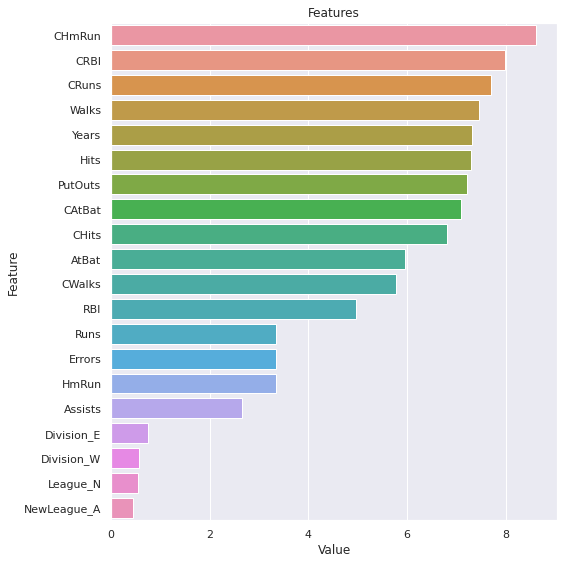

In [25]:
cb_model.feature_importances_

def plot_importance(model, features, num=len(X), save=False):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize=(8, 8))
    sns.set(font_scale=1)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value",
                                                                     ascending=False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show()
    if save:
        plt.savefig('importances.png')


plot_importance(cb_model, X, num=20)

### Conclusion

* The dataset has 322 rows and 20 columns.

* There are 17 numerical columns and 3 categorical columns.

* There are 59 (18%) missing rows in the dependent variable.

* There are highly correlated variables among the independent variables.

* According to the boxplot method, there are no outliers.

* According to the local outlier factor method, there is 1 outlier.

* Missing values were evaluated using two different methods.

* In the 1st alternative, missing values were filled using the KNN method.

* In alternative 2, missing values were removed from the data set.

* The model was validated using the k-fold cross validation method.

* According to the analyzes made, the best result was obtained by using alternative 1.

* In alternative 1, the CatBoost algorithm gave the best results.



#### Thanks for reading. I hope you enjoyed it. 
#### See you next time!


